<a href="https://colab.research.google.com/github/gustavopierre/data_science_portfolio/blob/master/Analise_Dados_Airbnb_em_Dublin_Irlanda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Análise dos Dados do Airbnb Relativos à Dublin, Irlanda**
O [Airbnb](https://airbnb.com) disponibiliza os seus dados relativos a cada cidade ao redor do mundo para análise da comunidade de Data Science.
Esses dados, antes de utilizados devem ser trabalhados para eliminar os erros que podem interferir nas informações geradas por eles.
O presente artigo consiste no primeiro projeto do curso Data Science na Prática da Sigmoidal.ai e, portanto, nele serão exibidos os comando em Python, tabelas e gráficos necessários para esta análise. Será abordada uma rápida preparação do ambiente, a obtenção dos dados e suas características, o tratamento deles para eliminação dos erros e a extração e exibição das informações relacionadas aos dados, que puderem ser extraídas, tais como: quantidade de unidades por bairro, quantidade de tipos de unidades, a média de preços dos tipos de unidades por bairros e a distribuição geográfica das unidades, com seus tipos e preços.
 

## **Configuração Inicial do Ambiente**
A linguagem de programação Python é amplamente utilizada para Data Science por ser opensource, facil de aprender, escalável e pela existência de bibliotecas que facilitam sua utilização. Para seu uso, serão necessárias algumas bibliotecas que foram importados para o ambiente:
* Pandas - uma biblioteca de uso fácil, que permite ao usuário explorar, manipular e visualizar os dados de um modo bastante exficiente.
* Matplotlib - uma biblioteca para visualização de dados.
* Seaborn - uma biblioteca de visualização baseada na Matplotlib.
* Folium - uma biblioteca que permite vizualização de dados manipulados em Python em um mapa interativo.

In [0]:
# importar os pacotes necessários para a análise
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster

%matplotlib inline

## **Obtenção dos Dados e suas Características**
Os dados usados foram obtidos no site [Inside Airbnb](http://insideairbnb.com/get-the-data.html), que disponibiliza vários dataset de Dublin. Como este é um estudo inicial, foi utilizado o dataset mais simplficado.



In [0]:
#importar o arquivo listings.csv para um DataFrame
df = pd.read_csv('http://data.insideairbnb.com/ireland/leinster/dublin/2020-04-23/visualisations/listings.csv')

A porção inicial do dataset é visualizado, a fim de realizar uma observar se foi carregado corretamente e para uma visualização inicial dos registros e seus atributos.

In [3]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,44077,cosy comfortable Irish cottage twin,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.28995,-6.25813,Private room,50,3,227,2020-03-06,2.05,3,314
1,85148,Habitación en Dublín Double room,466111,Don,NaN,South Dublin,53.30110,-6.31992,Private room,30,1,1,2019-05-11,0.09,1,174
2,85156,Cosy Comfortable Irish Cottage 1 Double Bed,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.29178,-6.25618,Private room,50,3,182,2020-03-09,1.68,3,308
3,121030,Comfy double room in central area 1,608225,Norah,NaN,Dublin City,53.33648,-6.22075,Private room,55,2,110,2019-03-19,1.02,3,82
4,159889,Friendly Single Room,766611,Margaret,NaN,Dublin City,53.39027,-6.23547,Private room,29,2,311,2020-02-09,3.15,3,344


É importante obter as informações relativas a quantidade de registros, os atributos existentes e os tipos desses atributos, bem como o nome dos atributos, pois isso influenciará nas tarefas futuras de tratamento e exibição dos dados para a obtenção das informações relativas a eles.

In [28]:
#identificar o volume de dados do DataFrame
print(f'Registros:\t{df.shape[0]}')
print(f'Atributos:\t{df.shape[1]}\n\n')
#verificar as 5 primeiras linhas entradas do dataset
display(df.dtypes)

Registros:	8961
Atributos:	16




id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

Observa-se que o dataset possui 8.961 registros com 16 atributos, que são:
* id - identificador único do registro - atributo do tipo inteiro;
* name - nome dado à unidade anunciada - atributo do tipo object;
* host_id - identificador do anfitrião - atributo do tipo inteiro;
* host_name - nome do anfitrião - atributo do tipo object;
* neighbourhood_group - identificador do grupo de bairros - atributo do tipo inteiro;
* neighbourhood - nome do bairro - atributo do tipo object;
* latitude - latitude da unidade - atributo do tipo ponto flutante (números fracionados ou não);
* longitude longitude da unidade - atributo do tipo ponto flutante (números fracionados ou não);
* room_type - tipo da unidade - atributo do tipo object;
* price - preço da unidade - atributo do tipo inteiro;
* minimum_nights - número mínimo de noites que devem ser reservadas - atributo do tipo inteiro;
* number_of_reviews - número de avalições que a unidade recebeu - atributo do tipo inteiro;
* last_review - última avaliação que a unidade recebeu - atributo do tipo object;
* reviews_per_month - quantidade de avaliações por mês - atributo do tipo ponto flutante (números fracionados ou não);
* calculated_host_listings_count - quantidade de unidades do mesmo anfitrião - atributo do tipo inteiro;
* availability_365- número de dias de disponibilidade dentro de 365 dias - atributo do tipo inteiro;

## **Tratamento dos Dados**
<p>É normal os dataset possuirem falhas de diversas origens. Portanto, deve ser verificado a existência de atributos com valores nulos, valores iguais a zero e com os valores que são pontos que ficam fora do padrão geral de uma distribuição, os chamados "outliers".</p>
<p>Buscando o percentual de valores nulos de cada atributo, podemos observar que o atributo "neighbourhood_group" está 100% com valor nulo, o que indica que podemos descartá-lo.</p>

In [29]:
# Ordenar os campos, em ordem descrescente, da quantidade percentual dos valores inexistentes, exibindo este percentual
(df.isnull().sum()*100/df.shape[0]).sort_values(ascending=False)

neighbourhood_group               100.000000
reviews_per_month                  16.661087
last_review                        16.661087
name                                0.011159
availability_365                    0.000000
calculated_host_listings_count      0.000000
number_of_reviews                   0.000000
minimum_nights                      0.000000
price                               0.000000
room_type                           0.000000
longitude                           0.000000
latitude                            0.000000
neighbourhood                       0.000000
host_name                           0.000000
host_id                             0.000000
id                                  0.000000
dtype: float64

In [0]:
# remover "neighbourhood_group", pois somente possui valores nulos
df_clean = df.copy()
df_clean.drop('neighbourhood_group', axis=1, inplace=True)

Os histogramas e o resumo estatístico podem nos fornecer informações relevantes para identificação de outliers. 

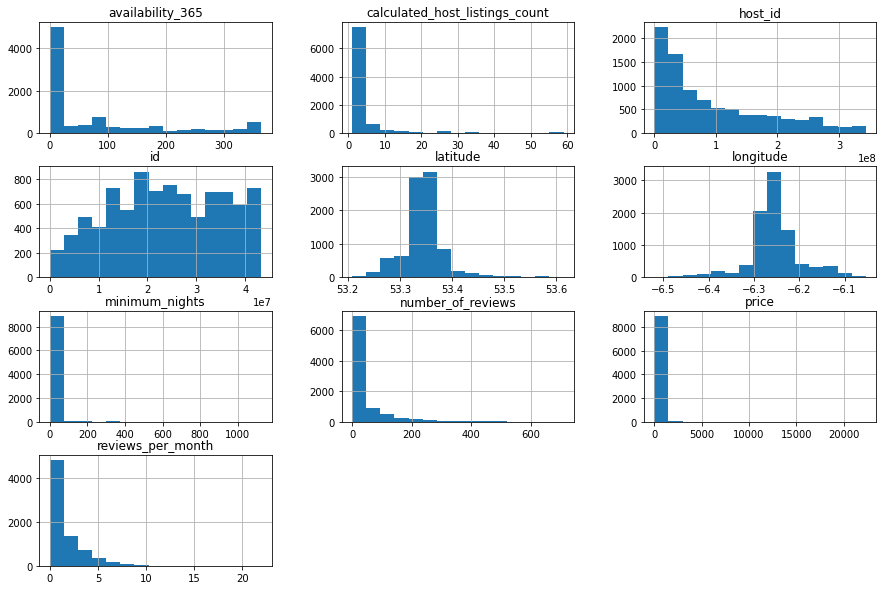

In [31]:
# plotar o histograma das variáveis numéricas
df_clean.hist(bins=15, figsize=(15,10));

In [33]:
# ver o resumo estatítico das variáveis numéricas
df_clean[["price", "latitude", "longitude", 'minimum_nights']].describe()

,price,latitude,longitude,minimum_nights
count,8961.000000,8961.000000,8961.000000,8961.000000
mean,137.972548,53.345717,-6.254619,4.485437
std,349.021742,0.043478,0.057335,21.873771
min,0.000000,53.208360,-6.519370,1.000000
25%,55.000000,53.330430,-6.277660,1.000000
50%,89.000000,53.344220,-6.259230,2.000000
75%,150.000000,53.357290,-6.235400,3.000000
max,22337.000000,53.614360,-6.053200,1125.000000


Com base na distribuição dos valores no histograma e no resumo estatístico, os valores mínimo, máximo e os quartis estão dentro do esperado para latitude e longitude. No entanto, observa-se valores iguais a zero para preço, bem como um valor máximo discrepante dos quartis para preço e mínimo de noites. Os quartis dividem os dados em grupos de 25% dos dados cada Com auxílio de um gráfico boxplot, podemos, visualmente analisar a distribuição dos preços e do mínimo de noites das unidades.

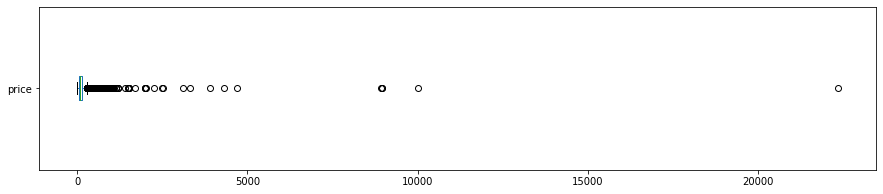

In [9]:
# price
df_clean.price.plot(kind="box", vert=False, figsize=(15,3))
plt.show()


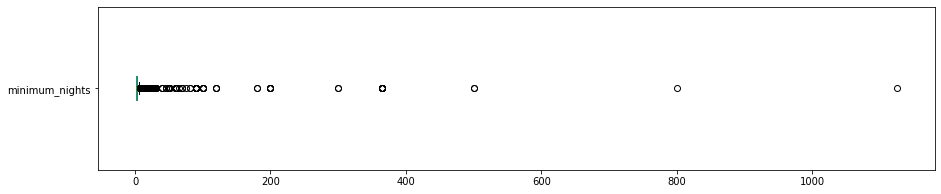

In [34]:
# minimum_nights
df_clean.minimum_nights.plot(kind="box", vert=False, figsize=(15,3))
plt.show()

Utilizando a regra 1.5 x IQR sobre o primeiro e o terceiro quartil, vamos obter os outliers dos preços e do número mínimo de noites.Verificando também a quantidade de outliers. Iniciando a verificação pelos preços das unidades e, em seguida, os números mínimo de noites.

In [47]:
# price
q3, q1 = np.percentile(df_clean.price, [75, 25])
print(f'q3 = {q3} e q1 = {q1}')
iqr = q3 - q1
print(f'iqr = {iqr}')
low_outlier = q1 - 1.5*iqr
high_outlier = q3 + 1.5*iqr
print(f'low outlier = {low_outlier}\nhigh outlier = {high_outlier}')
print(f'Existem {len(df_clean[df_clean.price < low_outlier])} outliers abaixo de {low_outlier} (low outlier)')
print(f'Existem {len(df_clean[df_clean.price > high_outlier])} outliers acima de {high_outlier} (high outlier)')

q3 = 150.0 e q1 = 55.0
iqr = 95.0
low outlier = -87.5
high outlier = 292.5
Existem 0 outliers abaixo de -87.5 (low outlier)
Existem 715 outliers acima de 292.5 (high outlier)


Considerando que o estudo se refere a preços de unidades, sugerimos a eliminação dos registros cujos dados de preços encontram acima de 1.000,00 e não aqueles acima de 292.50. Verificamos, então, a quantidade de registros cujo preços têm valores maiores que 1.000,00 e os eliminamos.

In [50]:
# verificando a quantidade de registros cujo preços têm valores maiores que 1.000,00
print("price: valores acima de 1000:")
print(f"{len(df_clean[df_clean.price > 1000])} registros")
print("{:.4f}%".format((len(df_clean[df_clean.price > 1000])/df_clean.shape[0])*100))

price: valores acima de 1000:
34 entradas
0.3794%


In [0]:
# removendo registros
df_clean.drop(df_clean[df_clean.price > 1000].index, axis=0, inplace=True)

Agora verificamos obtemos os outliers do número mínimo de noites.

In [52]:
# minimum_nights
q3, q1 = np.percentile(df_clean.minimum_nights, [75, 25])
print(f'q3 = {q3} e q1 = {q1}')
iqr = q3 - q1
print(f'iqr = {iqr}')
low_outlier = q1 - 1.5*iqr
high_outlier = q3 + 1.5*iqr
print(f'low outlier = {low_outlier}\nhigh outlier = {high_outlier}')
print(f'Existem {len(df_clean[df_clean.minimum_nights < low_outlier])} outliers abaixo de {low_outlier} (low outlier)')
print(f'Existem {len(df_clean[df_clean.minimum_nights > high_outlier])} outliers acima de {high_outlier} (high outlier)')

q3 = 3.0 e q1 = 1.0
iqr = 2.0
low outlier = -2.0
high outlier = 6.0
Existem 0 outliers abaixo de -2.0 (low outlier)
Existem 997 outliers acima de 6.0 (high outlier)


Considerando que a verificação se refere a mínimo de noites nas unidades, sugerimos a eliminação dos registros cujos dados se encontram acima de 30 noites e não aqueles acima de 6. Verificamos, então, a quantidade de registros cujo com valores maiores que 30 e os eliminamos.


In [53]:
# verificando a quantidade de registros com minimum_nights com valores maiores que 30
print("minimum_nights: valores acima de 30:")
print(f"{len(df_clean[df_clean.minimum_nights > 30])} registros")
print("{:.4f}%".format((len(df_clean[df_clean.minimum_nights > 30])/df_clean.shape[0])*100))

minimum_nights: valores acima de 30:
76 registros
0.8513%


In [0]:
# removendo os registros
df_clean.drop(df_clean[df_clean.minimum_nights > 30].index, axis=0, inplace=True)

Exibindo o resumo estatístico, teremos:

In [55]:
df_clean.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,8.851000e+03,8.851000e+03,8851.000000,8851.000000,8851.000000,8851.000000,8851.000000,7389.000000,8851.000000,8851.000000
mean,2.376450e+07,9.423876e+07,53.345714,-6.254585,125.160321,3.205739,36.689527,1.551390,3.821037,77.439272
std,1.142782e+07,8.896532e+07,0.043616,0.057468,125.791878,4.161654,65.399952,1.857727,7.576715,111.497160
min,4.407700e+04,4.398400e+04,53.208360,-6.519370,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,1.460123e+07,2.307282e+07,53.330415,-6.277700,55.000000,1.000000,1.000000,0.240000,1.000000,0.000000
50%,2.355711e+07,6.037321e+07,53.344210,-6.259200,89.000000,2.000000,9.000000,0.830000,1.000000,2.000000
75%,3.364221e+07,1.495939e+08,53.357255,-6.235375,150.000000,3.000000,40.000000,2.220000,3.000000,120.000000
max,4.325814e+07,3.435080e+08,53.614360,-6.053200,1000.000000,30.000000,710.000000,21.950000,59.000000,365.000000


Vamos verificar a quantidade de registros com preço igual a zero.

In [56]:
# verificando a quantidade de unidades com preço igual a zero
print("price: valores iguais a zero:")
print(f"{len(df_clean[df_clean.price == 0])} entradas")
print("{:.4f}%".format((len(df_clean[df_clean.price == 0])/df_clean.shape[0])*100))

price: valores iguais a zero:
1 entradas
0.0113%


Quanto ao preço igual a zero, temos duas opções: eliminá-lo ou considerá-lo a média do valor dos demais preços. Optamos pela segunda.

In [15]:
# alterando o valor de zero para a média de preços (não incluindo o zero no cálculo)
nonzero_mean = df_clean[ df_clean.price != 0 ].mean()
df_clean.loc[ df_clean.price == 0, "price" ] = nonzero_mean

df_clean.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,8.927000e+03,8.927000e+03,8927.000000,8927.000000,8926.000000,8927.000000,8927.000000,7445.000000,8927.000000,8927.000000
mean,2.375896e+07,9.430229e+07,53.345742,-6.254642,125.544701,4.464546,36.532318,1.546171,3.817072,77.827154
std,1.142581e+07,8.916159e+07,0.043523,0.057375,126.632248,21.811828,65.210339,1.854491,7.549451,111.828819
min,4.407700e+04,4.398400e+04,53.208360,-6.519370,9.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,1.460672e+07,2.307128e+07,53.330385,-6.277765,55.000000,1.000000,1.000000,0.240000,1.000000,0.000000
50%,2.353167e+07,6.003250e+07,53.344230,-6.259210,89.000000,2.000000,9.000000,0.820000,1.000000,2.000000
75%,3.362036e+07,1.497558e+08,53.357295,-6.235410,150.000000,3.000000,40.000000,2.220000,3.000000,121.000000
max,4.325814e+07,3.435080e+08,53.614360,-6.053200,1000.000000,1125.000000,710.000000,21.950000,59.000000,365.000000


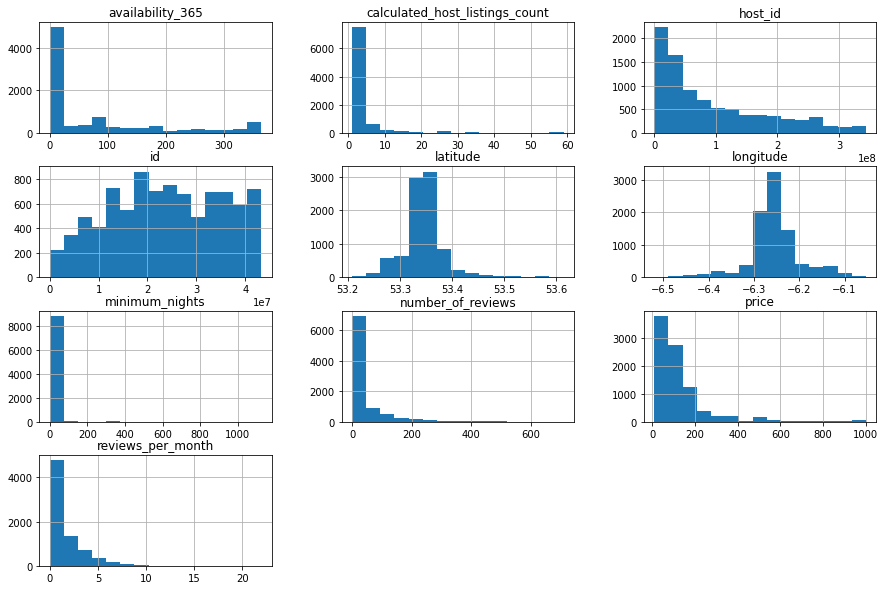

In [16]:
# plotar o histograma para as variáveis numéricas
df_clean.hist(bins=15, figsize=(15, 10));

Correlação significa que existe uma relação entre duas coisas. No nosso contexto, estamos buscando relação ou semelhança entre duas variáveis.

Essa relação pode ser medida, e é função do coeficiente de correlação estabelecer qual a intensidade dela. Para identificar as correlações existentes entre as variáveis de interesse, vamos:

* Criar uma matriz de correlação
* Gerar um heatmap a partir dessa matriz, usando a biblioteca seaborn

In [58]:
# criar uma matriz de correlação
corr = df_clean[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
    'calculated_host_listings_count', 'availability_365']].corr()

display(corr)

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
price,1.000000,0.033784,-0.058605,-0.033822,0.149212,0.120562
minimum_nights,0.033784,1.000000,-0.050282,-0.070364,0.097163,0.063502
number_of_reviews,-0.058605,-0.050282,1.000000,0.779329,-0.001023,0.172058
reviews_per_month,-0.033822,-0.070364,0.779329,1.000000,0.061169,0.184124
calculated_host_listings_count,0.149212,0.097163,-0.001023,0.061169,1.000000,0.177890
availability_365,0.120562,0.063502,0.172058,0.184124,0.177890,1.000000


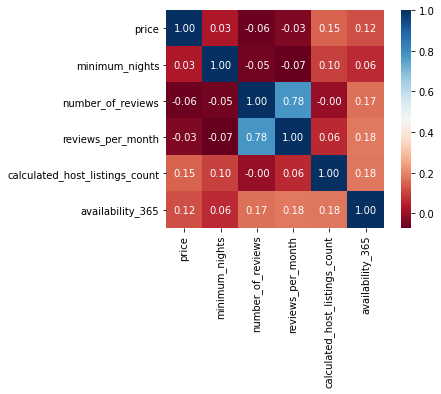

In [59]:
sns.heatmap(corr, cmap='RdBu', fmt='.2f', square=True, linecolor='white', annot=True);

Agora temos os dados prontos para extrair as informações desejadas.

## **Informações Obtidas a Partir do Dados**
Algumas informações obtidas sãosão:
* quantidade de unidades por bairro; 
* quantidade de tipos de unidades; 
* a média de preços dos tipos de unidades por bairros; e
* a distribuição geográfica das unidades, com seus tipos e preços.

In [60]:
# Total de unidades
df_clean.shape[0]

8851

In [61]:
# mostrar a quantidade de unidades por bairro
df_clean.neighbourhood.value_counts()

Dublin City              6791
Dn Laoghaire-Rathdown     951
Fingal                    773
South Dublin              336
Name: neighbourhood, dtype: int64

In [62]:
# mostrar a quantidade de unidades em termos percentuais
df_clean.neighbourhood.value_counts()*100/df_clean.shape[0]

Dublin City              76.725794
Dn Laoghaire-Rathdown    10.744549
Fingal                    8.733476
South Dublin              3.796181
Name: neighbourhood, dtype: float64

Obtemos que, aproximadamente, 77% das unidades estão localizadas em Dublin City, correspondendo a um total de 6.868 unidades de um total de 8.851 unidades.

In [63]:
# mostrar a quantidade de cada tipo de unidade disponível
df_clean.room_type.value_counts()

Entire home/apt    4377
Private room       4245
Shared room         145
Hotel room           84
Name: room_type, dtype: int64

In [65]:
# mostrar a porcentagem de cada tipo de imóvel disponível
df_clean.room_type.value_counts()*100/df_clean.shape[0]

Entire home/apt    49.452039
Private room       47.960682
Shared room         1.638233
Hotel room          0.949045
Name: room_type, dtype: float64

As unidades do tipo apartamento ou casa inteira correspondem a aproximadamente 49% das unidades existentes, muito próximo dos cerca de 48% de quartos privados. Apesar de existirem quartos compartilhados e quartos de hotéis, estes são em número bem reduzido em relação aos outros tipos.

In [66]:
df_clean.groupby(['neighbourhood']).price.mean().sort_values(ascending=False)

neighbourhood
Dublin City              132.743190
Dn Laoghaire-Rathdown    115.945321
Fingal                    89.865459
South Dublin              79.181548
Name: price, dtype: float64

In [67]:
df_clean.groupby(['neighbourhood','room_type'])['price'].mean()

neighbourhood          room_type      
Dn Laoghaire-Rathdown  Entire home/apt    163.549266
                       Private room        68.335484
                       Shared room         52.777778
Dublin City            Entire home/apt    176.139555
                       Hotel room         267.172840
                       Private room        81.927608
                       Shared room         48.975806
Fingal                 Entire home/apt    151.007576
                       Hotel room          86.666667
                       Private room        57.625251
                       Shared room         83.571429
South Dublin           Entire home/apt    141.764045
                       Private room        56.516529
                       Shared room         62.200000
Name: price, dtype: float64

<p>A média de preços de unidades é maior em Dublin City e o preço de unidade do tipo quarto de hotel tem preço médio maior do que os outros tipos somente em Dublin City</p>
<p>A concentração da unidades geograficamente pode ser verificado com o uso das bilbliotecas importadas para o ambiente. Na primeira visualização, a biblioteca gera uma visualização estática. A segunda visualização permite uma interação maior com a mesma, possibilitando ver não só a concentração das unidades, como seu valor e tipo da unidade, bem como realizar zoom no mapa.</p> 

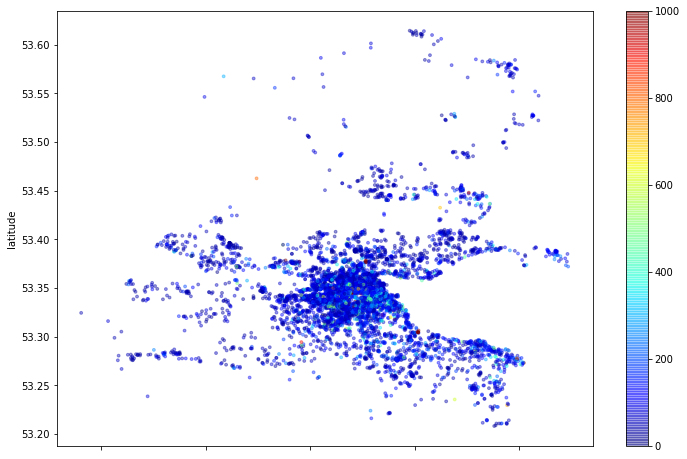

In [68]:
# plotar os imóveis pela posição geográfica
df_clean.plot(kind='scatter', x='longitude', y='latitude', alpha=0.4, c=df_clean['price'], s=8, cmap=plt.get_cmap('jet'), figsize=(12,8));

In [69]:
# plotar os imóveis no mapa da Irlanda
mapa = folium.Map(
    #location=[53.342331, -6.231945],
    location=[df_clean['latitude'].mean(), df_clean['longitude'].mean()],
    tiles='OpenStreetMap',
    zoom_start=11
)
marker_cluster = MarkerCluster().add_to(mapa)

for _, airbnb in df_clean.iterrows():
  #definindo as cores dos marcadores em função do valor do airbnb (até 50 - green, até 150 - orange  e mais que 150 - red )
  if airbnb['price'] <= 50:
    color = 'green'
  elif 50 < airbnb['price'] <= 150:
    color = 'orange'
  else:
    color = 'red'

  folium.Marker(
      location=[airbnb['latitude'], airbnb['longitude']],
      popup="<center>{}</center><br><center>{:.2f}</center>".format(airbnb['room_type'], airbnb['price']),
      icon=folium.Icon(color=color)
  ).add_to(marker_cluster)

mapa.save('/content/irlanda_airbnb.html')

mapa

## **Conclusão**
 Apesar de um estudo incipiente sobre o tema, podemos concluir que os dados precisam ser verificados e tratados antes de extrair as informações que se deseja. No caso desse estudo, observamos a concentração das unidades em Dublin City, bem como a média mais elevada de preço. Observamos também que somente em Dublin City as unidades do tipo quarto de hotel possuem média de preço maior do que o tipo apartamento ou casa ineteira. No que tange à visualização, um mapa interativo acrescenta muito em inúmeras situações, facilitando a visualização, conforme a necessidade do leitor. No entanto, esta funcionalidade pode não ser possível utilizar, dependendo do repositório em que este artigo se encontra. 

## **Referências**
* Canal do YouTube Mineirando Dados. Plotando Mapas Interativos com Python (Visualize Dados de Vendas por Região). 2019. Disponível em: <https://youtu.be/EElW-W0GmrA>. Acesso em: 08 jun. 2020.

* Carlos Melo. Sigmoidal. Dispinível em: <https://sigmoidal.ai/>. Acesso em: 01 jun. 2020.

* Elipse Knowledgebase. Removendo dados discrepantes (outliers) com a linguagem Python. Disponível em: <https://kb.elipse.com.br/removendo-dados-discrepantes-outliers-com-a-linguagem-python/>. Acesso em: 12 jun. 2020.

* Inside Airbnb. Get the Data. Disponível em: <http://insideairbnb.com/get-the-data.html>. Acesso em: 07 jun. 2020.

* Jessica Temporal. Colocando Pontos num Mapa com Folium. 2017. Disponível em: <https://jtemporal.com/folium/>. Acesso em: 08 jun. 2020.

* Kan Achademy. Identifying outliers with the 1.5xIQR rule. Disponível em:<https://www.khanacademy.org/math/statistics-probability/summarizing-quantitative-data/box-whisker-plots/a/identifying-outliers-iqr-rule>. Acesso em: 10 jun. 2020.

* Larissa Borges. Referência de Site ABNT: veja como fazer com exemplos para não errar mais!. 2018. Disponível em: <https://comunidade.rockcontent.com/como-fazer-referencia-de-site/>. Acesso em: 09 jun. 2020.

* Lucas Ximenes. Python e a Ciência de Dados. 2020. Disponível em: <https://abracd.org/python-e-a-ciencia-de-dados/>. Acesso em: 07 jun. 2020.

* Nicholas Leong. Python for Data Science- A Guide to Pandas. 2019. Disponível em: <https://towardsdatascience.com/python-for-data-science-basics-of-pandas-5f8d9680617e>. Acesso em: 07 jun. 2020.

* Matplotlib. Disponível em: <https://matplotlib.org/>. Acesso em: 08 jun. 2020.

* Portal da Educação. Referências Bibliográficas Tiradas na Internet: Como Colocar no Trabalho?. Disponível em: <https://siteantigo.portaleducacao.com.br/conteudo/artigos/nutricao/referencias-bibliograficas-tiradas-na-internet-como-colocar-no-trabalho/48764>. Acesso em: 09 jun. 2020.

* Python-visualization/folium. Disponível em: <https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/MarkerCluster.ipynb>. Acesso em 08 jun. 2020.

* Seaborn: Statistical Data Visualization. Disponível em: <https://seaborn.pydata.org/>. Acesso em: 08 jun. 2020.

* Serdar Yegulalp. Python: principal caso de uso é para ciência de dados, mostra estudo. 2019. Disponível em: <https://computerworld.com.br/2019/02/08/python-principal-caso-de-uso-e-para-ciencia-de-dados-mostra-estudo/>. Acesso em: 07 jun. 2020.